# Assessment

## Import libraries

In [ ]:
pip install -U ydata-profiling[notebook,unicode]

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
! ls '/content/gdrive/MyDrive/Data_Science_mentoring/snp_test'

 assessment_task.ipynb			'InstructionsDataScienceAssessment (2).pdf'
'ds_assessment_data_2008_2016 (2).csv'


In [47]:
import pandas as pd
import numpy as np
import os
import random
import warnings
warnings.filterwarnings('ignore')

import seaborn as sns
import matplotlib.pyplot as plt

from ydata_profiling import ProfileReport

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

import hyperopt
from hyperopt import hp, tpe, fmin, STATUS_OK

import pickle

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [2]:
# Commonly used constants and paths
SEED = 42
DATA_PATH = '/content/gdrive/MyDrive/Data_Science_mentoring/snp_test'
DATA_FILE = f'{DATA_PATH}/ds_assessment_data_2008_2016 (2).csv'
TARGET = 'target'

## EDA

In [3]:
data = pd.read_csv(DATA_FILE)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 856 entries, 0 to 855
Columns: 104 entries, id to financial_health_score
dtypes: float64(97), int64(2), object(5)
memory usage: 695.6+ KB


In [7]:
ProfileReport(data, missing_diagrams=None, samples=None, interactions=None)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

There are some features, that were falsely categorized as string

In [5]:
obj_cols = list(data.select_dtypes(np.object))
obj_cols

['id', 'calendar_end', 'CF_INV_returns', 'GW_TOT_returns', 'NDT_returns']

In [6]:
data[obj_cols]

,id,calendar_end,CF_INV_returns,GW_TOT_returns,NDT_returns
0,c141,31-12-10,NaN,NaN,NaN
1,c141,31-12-11,NaN,NaN,NaN
2,c141,31-12-12,NaN,NaN,NaN
3,c141,31-12-13,NaN,NaN,NaN
4,c141,31-12-14,NaN,NaN,NaN
...,...,...,...,...,...
851,c267,31-12-12,NaN,0.1334618,NaN
852,c267,31-12-13,NaN,0.155791685,NaN
853,c267,31-12-14,NaN,0.206509729,1.255813953
854,c267,31-12-15,NaN,0.033379096,-0.510309278


In [7]:
data['CF_INV_returns'].unique()[:5]

array([nan, '0.193342533', '0.461141033', '-0.554158078', '0.316706258'],
      dtype=object)

In [8]:
data = data.replace('#NAME?', np.nan)

In [9]:
colstofloat  = ['CF_INV_returns','GW_TOT_returns', 'NDT_returns']
data[colstofloat] = data[colstofloat].astype(float)

*   Some 'returns' columns contain infinity values, these happen when we have dividends in the current year and in the previous year, the dividend value was 0. I'll replace the returns values, with the Dividend values.
*   Also, the Nan values, appear, when we have a 0 value, both in the current and the previous years. In these cases, I'll replace them with 0.

In [10]:
inf_cols = list(data.max()[data.max().values == np.inf].index)

In [11]:
data[data['Dividend_returns']==np.inf].head()

,id,calendar_end,fiscal_year_end_year,Dividend,Dividend_returns,ASSETS,BFNG,BPS,BPS_TANG,CAPEX,...,EPS_returns,EPS_EX_XORD_returns,SALES_returns,S_M_EXP_returns,EBITDAR_returns,REV_TOT_returns,EPSRD_returns,debt_factor,profitability,financial_health_score
35,c146,31-12-12,2012,5.4,inf,0.262434,NaN,2.224981,NaN,0.127845,...,0.774278,NaN,0.088143,0.263636,NaN,NaN,NaN,0.019729,0.028993,3
69,c151,31-12-14,2014,12.0,inf,0.120393,0.033212,1.903544,NaN,0.118313,...,1.862500,NaN,0.034288,NaN,NaN,NaN,NaN,3.040796,0.033853,2
95,c155,31-12-11,2011,2.2,inf,NaN,NaN,NaN,NaN,0.003888,...,-0.285130,NaN,0.157793,NaN,NaN,NaN,NaN,3.220588,-0.113849,1
113,c157,31-12-12,2012,12.0,inf,0.066492,NaN,NaN,NaN,0.080503,...,-0.054545,NaN,0.088417,NaN,NaN,NaN,NaN,2.254599,0.047347,3
145,c162,31-12-13,2013,60.0,inf,NaN,0.125418,NaN,NaN,0.058662,...,-0.398595,NaN,0.048849,NaN,NaN,NaN,NaN,NaN,0.041254,1


In [12]:
data[data['id']=='c146']

,id,calendar_end,fiscal_year_end_year,Dividend,Dividend_returns,ASSETS,BFNG,BPS,BPS_TANG,CAPEX,...,EPS_returns,EPS_EX_XORD_returns,SALES_returns,S_M_EXP_returns,EBITDAR_returns,REV_TOT_returns,EPSRD_returns,debt_factor,profitability,financial_health_score
31,c146,31-12-08,2008,8.0,0.142857,0.182442,NaN,1.692810,NaN,0.148657,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.543809,0.009820,3
32,c146,31-12-09,2009,7.0,-0.125000,0.198077,NaN,1.567804,NaN,0.091710,...,-1.305677,NaN,-0.404006,NaN,NaN,NaN,NaN,3.467711,-0.005749,1
33,c146,31-12-10,2010,0.0,-1.000000,0.075819,NaN,1.579947,NaN,0.065638,...,0.614286,NaN,0.219950,-0.030702,NaN,NaN,NaN,2.476103,-0.001409,2
34,c146,31-12-11,2011,0.0,NaN,NaN,NaN,1.842312,NaN,0.073185,...,15.111111,NaN,0.472234,-0.004525,NaN,NaN,NaN,0.534000,0.018018,3
35,c146,31-12-12,2012,5.4,inf,0.262434,NaN,2.224981,NaN,0.127845,...,0.774278,NaN,0.088143,0.263636,NaN,NaN,NaN,0.019729,0.028993,3
36,c146,31-12-13,2013,18.0,2.333333,0.259415,0.139391,2.293063,NaN,0.127616,...,-0.584320,NaN,0.140323,0.161871,NaN,NaN,NaN,1.256714,0.010957,3
37,c146,31-12-14,2014,22.0,0.222222,0.337738,0.285210,2.482499,NaN,0.178160,...,1.486238,NaN,0.080636,0.222910,NaN,NaN,NaN,1.300372,0.020747,3
38,c146,31-12-15,2015,37.0,0.681818,0.411949,0.521025,3.022597,NaN,0.230075,...,0.991031,NaN,-0.293407,0.541392,NaN,NaN,NaN,0.796381,0.053638,3
39,c146,31-12-16,2016,42.0,0.135135,0.500667,0.248333,3.229085,NaN,0.216810,...,-0.709058,NaN,-0.143812,-0.500698,NaN,NaN,NaN,1.771814,0.029859,3


In [13]:
for col in inf_cols:
  og = col.replace("_returns", "")
  data[col] = data[col].mask(data[col]==np.inf, data[og])
  data[col].fillna(0, inplace=True)

In [14]:
data[data['id']=='c146']

,id,calendar_end,fiscal_year_end_year,Dividend,Dividend_returns,ASSETS,BFNG,BPS,BPS_TANG,CAPEX,...,EPS_returns,EPS_EX_XORD_returns,SALES_returns,S_M_EXP_returns,EBITDAR_returns,REV_TOT_returns,EPSRD_returns,debt_factor,profitability,financial_health_score
31,c146,31-12-08,2008,8.0,0.142857,0.182442,NaN,1.692810,NaN,0.148657,...,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.543809,0.009820,3
32,c146,31-12-09,2009,7.0,-0.125000,0.198077,NaN,1.567804,NaN,0.091710,...,-1.305677,NaN,-0.404006,NaN,NaN,NaN,NaN,3.467711,-0.005749,1
33,c146,31-12-10,2010,0.0,-1.000000,0.075819,NaN,1.579947,NaN,0.065638,...,0.614286,NaN,0.219950,-0.030702,NaN,NaN,NaN,2.476103,-0.001409,2
34,c146,31-12-11,2011,0.0,0.000000,NaN,NaN,1.842312,NaN,0.073185,...,15.111111,NaN,0.472234,-0.004525,NaN,NaN,NaN,0.534000,0.018018,3
35,c146,31-12-12,2012,5.4,5.400000,0.262434,NaN,2.224981,NaN,0.127845,...,0.774278,NaN,0.088143,0.263636,NaN,NaN,NaN,0.019729,0.028993,3
36,c146,31-12-13,2013,18.0,2.333333,0.259415,0.139391,2.293063,NaN,0.127616,...,-0.584320,NaN,0.140323,0.161871,NaN,NaN,NaN,1.256714,0.010957,3
37,c146,31-12-14,2014,22.0,0.222222,0.337738,0.285210,2.482499,NaN,0.178160,...,1.486238,NaN,0.080636,0.222910,NaN,NaN,NaN,1.300372,0.020747,3
38,c146,31-12-15,2015,37.0,0.681818,0.411949,0.521025,3.022597,NaN,0.230075,...,0.991031,NaN,-0.293407,0.541392,NaN,NaN,NaN,0.796381,0.053638,3
39,c146,31-12-16,2016,42.0,0.135135,0.500667,0.248333,3.229085,NaN,0.216810,...,-0.709058,NaN,-0.143812,-0.500698,NaN,NaN,NaN,1.771814,0.029859,3


There are also many columns, when we have a high ratio of missing values.

I'll remove the columns, where the ratio of missing values is higher than 75%

In [15]:
percent_missing = data.isnull().sum() * 100 / len(data)
missing_values = pd.DataFrame({
    'col_name': data.columns,
    'percent_missing': percent_missing
})

In [16]:
missing_values[missing_values['percent_missing']>75].count()
missing_values[missing_values['percent_missing']>75]

col_name           25
percent_missing    25
dtype: int64

,col_name,percent_missing
BPS_TANG,BPS_TANG,98.481308
EBITR,EBITR,88.668224
EBIT_ADJ,EBIT_ADJ,83.411215
EPSRD,EPSRD,93.691589
EPS_EX_XORD,EPS_EX_XORD,98.831776
ORGANICGROWTH,ORGANICGROWTH,97.546729
RD_EXP,RD_EXP,92.406542
S_M_EXP,S_M_EXP,91.004673
EBITA,EBITA,99.532710
REV_TOT,REV_TOT,99.649533


In [17]:
miss_col = missing_values[missing_values['percent_missing']>75].col_name.values.tolist()
data.drop(columns=miss_col, inplace=True)

<Figure size 1000x300 with 0 Axes>

[Text(0.5, 1.0, 'Dividend_returns')]

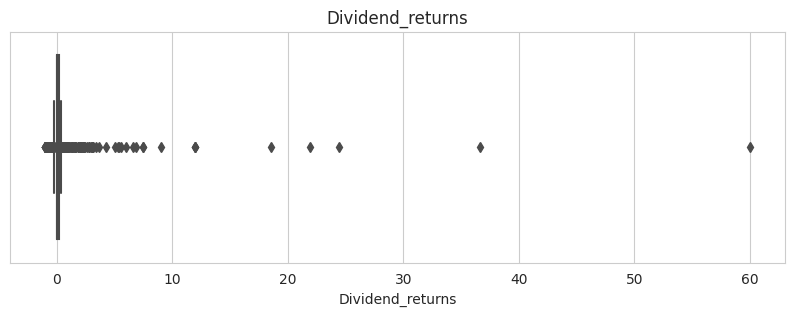

In [18]:
plt.figure(figsize=(10,3))
sns.set_style("whitegrid")
sns.boxplot(x='Dividend_returns',data = data, color='steelblue').set(title='Dividend_returns')

<Figure size 1000x300 with 0 Axes>

[Text(0.5, 1.0, 'Dividend_returns')]

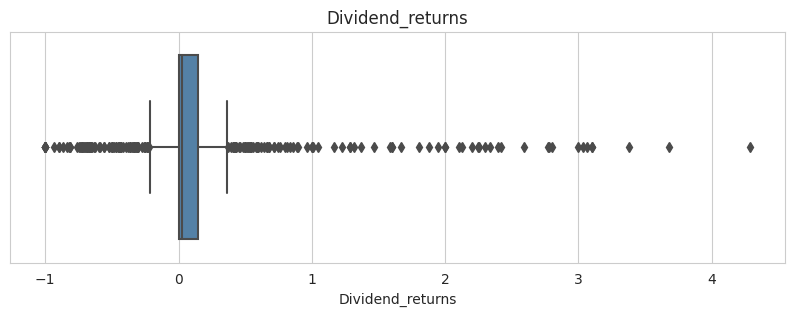

In [19]:
plt.figure(figsize=(10,3))
sns.set_style("whitegrid")
sns.boxplot(x='Dividend_returns',data = data[data['Dividend_returns']<5], color='steelblue').set(title='Dividend_returns')

<Figure size 1000x300 with 0 Axes>

[Text(0.5, 1.0, 'Dividend_returns')]

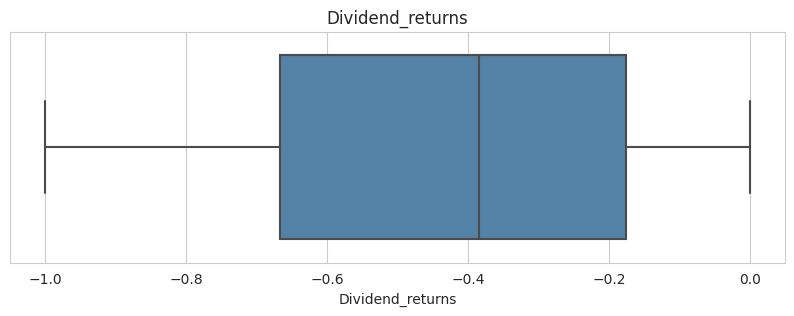

In [20]:
plt.figure(figsize=(10,3))
sns.set_style("whitegrid")
sns.boxplot(x='Dividend_returns',data = data[data['Dividend_returns']<0], color='steelblue').set(title='Dividend_returns')

Creating target variable: when the Dividend_returns is less than 0, is 1, otherwise 0.

In [21]:
data['target'] = (data['Dividend_returns']<=0).astype('int')

In [22]:
data['target'].value_counts()

0    480
1    376
Name: target, dtype: int64

<Figure size 3000x1000 with 0 Axes>

<Axes: >

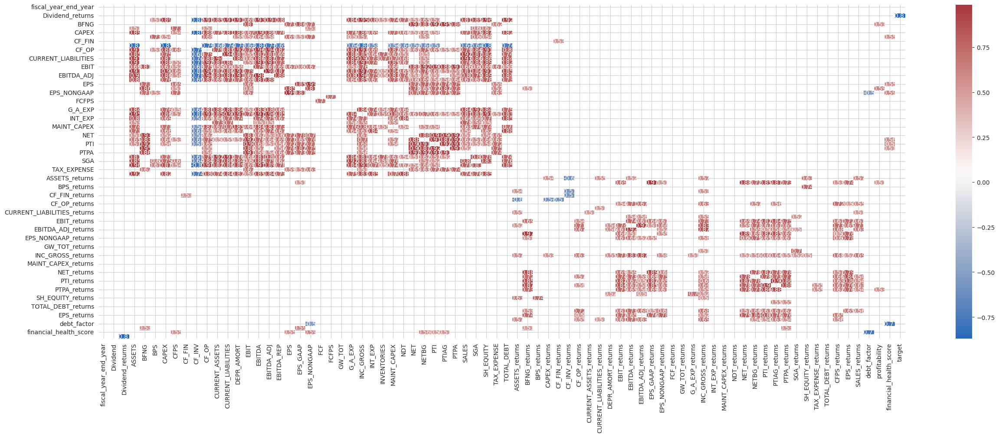

In [23]:
dfCorr = data.corr(method='spearman')
filteredDf = dfCorr[((dfCorr >= .5) | (dfCorr <= -.5)) & (dfCorr !=1.000)]
plt.figure(figsize=(30,10))
sns.heatmap(filteredDf, annot=True, cmap=sns.color_palette("vlag", as_cmap=True))
plt.show()

<Figure size 1000x1500 with 0 Axes>

<Axes: >

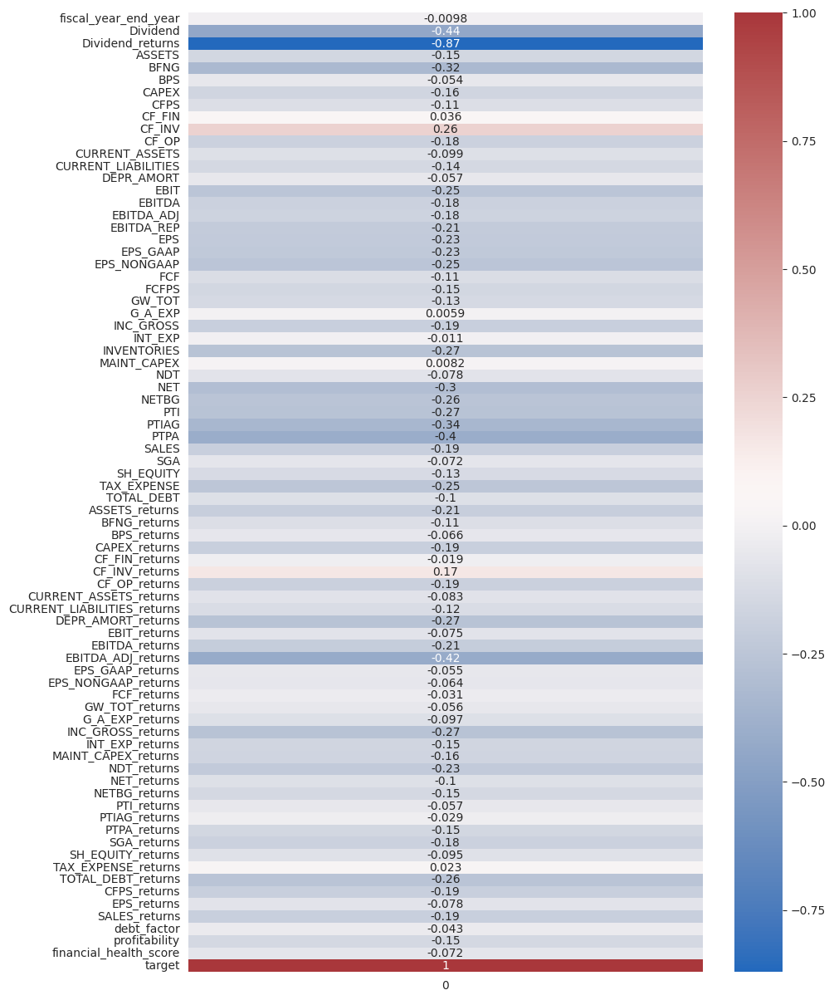

In [24]:
dfCorr = data.corrwith(data[TARGET], method='spearman')
plt.figure(figsize=(10,15))
sns.heatmap(pd.DataFrame(index=dfCorr.index, data=dfCorr.values), annot=True, cmap=sns.color_palette("vlag", as_cmap=True))
plt.show()

Creating multiindex with the company id & the fiscal year

In [25]:
data.set_index(['id', 'fiscal_year_end_year'], inplace=True)
data

calendar_end  Dividend  Dividend_returns    ASSETS  \
id   fiscal_year_end_year                                                      
c141 2010                     31-12-10      10.8          0.000000       NaN   
     2011                     31-12-11      11.4          0.055556       NaN   
     2012                     31-12-12      12.4          0.087719       NaN   
     2013                     31-12-13      13.2          0.064516       NaN   
     2014                     31-12-14      17.6          0.333333       NaN   
...                                ...       ...               ...       ...   
c267 2012                     31-12-12       3.0          0.000000  0.100826   
     2013                     31-12-13       3.0          0.000000  0.116326   
     2014                     31-12-14       3.0          0.000000  0.119779   
     2015                     31-12-15       4.8          0.600000  0.111665   
     2016                     31-12-16       4.8          0.000000  0.132852   

                               BFNG       BPS     CAPEX      CFPS    CF_FIN  \
id   fiscal_year_end_year                                                     
c141 2010                       NaN       NaN       NaN       NaN       NaN   
     2011                       NaN       NaN       NaN       NaN       NaN   
     2012                       NaN       NaN       NaN       NaN       NaN   
     2013                       NaN       NaN       NaN       NaN       NaN   
     2014                       NaN       NaN       NaN       NaN       NaN   
...                             ...       ...       ...       ...       ...   
c267 2012                  0.064553  1.482799  0.006518  0.588679 -0.051844   
     2013                  0.068706  1.635459  0.018914  0.778128 -0.019204   
     2014                  0.075023  1.824800  0.011481  0.189192 -0.026127   
     2015                  0.063233  1.897571  0.011664  0.818726 -0.037590   
     2016                  0.042798       NaN  0.008256  0.663536 -0.013622   

                           CF_INV  ...  SH_EQUITY_returns  \
id   fiscal_year_end_year          ...                      
c141 2010                     NaN  ...                NaN   
     2011                     NaN  ...                NaN   
     2012                     NaN  ...                NaN   
     2013                     NaN  ...                NaN   
     2014                     NaN  ...                NaN   
...                           ...  ...                ...   
c267 2012                     NaN  ...           0.144597   
     2013                     NaN  ...           0.089063   
     2014                     NaN  ...           0.110787   
     2015                     NaN  ...           0.030297   
     2016                     NaN  ...           0.009680   

                           TAX_EXPENSE_returns  TOTAL_DEBT_returns  \
id   fiscal_year_end_year                                            
c141 2010                             0.000000                 0.0   
     2011                             0.000000                 0.0   
     2012                             0.000000                 0.0   
     2013                             0.000000                 0.0   
     2014                             0.000000                 0.0   
...                                        ...                 ...   
c267 2012                             0.000000                 0.0   
     2013                            -0.002525                 0.0   
     2014                             0.238532                 0.0   
     2015                            -0.234496                 0.0   
     2016                            -0.463284                 0.0   

                           CFPS_returns  EPS_returns  SALES_returns  \
id   fiscal_year_end_year                                             
c141 2010                           NaN     0.000000            NaN   
     2011                           NaN

## Feature preparation

In [26]:
features = [x for x in list(data.columns) if x not in ['calendar_end','Dividend', 'Dividend_returns', 'target']]

In [27]:
data_logit = data

In [29]:
for col in features:
  data_logit[col] = data[col].interpolate(method='linear', limit_direction='both', axis=0)

In [30]:
x_data, y_data = data[features], data[TARGET]
x_train, y_train = data[data.index.get_level_values(1)<2016][features], data[data.index.get_level_values(1)<2016][TARGET]
x_test, y_test = data[data.index.get_level_values(1)>=2016][features], data[data.index.get_level_values(1)>=2016][TARGET]

In [46]:
x_data_lr, y_data_lr = data_logit[features], data_logit[TARGET]

In [31]:
x_train_lr, y_train_lr = data_logit[data_logit.index.get_level_values(1)<2016][features], data_logit[data_logit.index.get_level_values(1)<2016][TARGET]
x_test_lr, y_test_lr = data_logit[data_logit.index.get_level_values(1)>=2016][features], data_logit[data_logit.index.get_level_values(1)>=2016][TARGET]

In [32]:
minmax = MinMaxScaler()
x_train_lr = pd.DataFrame(minmax.fit_transform(x_train), columns=x_train.columns)
x_test_lr = pd.DataFrame(minmax.transform(x_test), columns=x_test.columns)

## Models

### Helper functions

In [33]:
def evaluate_model(classifier, train_set, train_target, test_set, test_target, metrics=[roc_auc_score]):
  prediction = train_model(classifier, train_set, train_target, test_set)
  results = get_model_metrics(classifier.__class__.__name__, test_target, prediction, metrics=[roc_auc_score, accuracy_score, precision_score, f1_score])
  return results

def train_model(classifier, train_set, train_target, test_set):
  classifier.fit(train_set, train_target)
  return classifier.predict_proba(test_set)

def get_model_metrics(classifier_name, test_target, prediction, metrics=[roc_auc_score]):
  metrics_result = dict()
  for metric in metrics:
    score = metric(test_target, prediction[:,1])
    print("{} for model {} = {:.3f}".format(metric.__name__, classifier_name, score))

    metrics_result[metric.__name__] = score
    metrics_result['classifier'] = classifier_name
    return metrics_result

In [42]:
def plot_importance(est, colnames, class_nr, top_n=20):
  importance = pd.DataFrame({
      'abs_weight': np.abs(est.feature_importances_[:]),
      'feature': colnames
  })

  imp20 = importance.sort_values(by='abs_weight', ascending=False)[:top_n]
  sns.barplot(y='feature', x='abs_weight', data=imp20, orient='h').set(title=f'Class {class_nr}')

### Models

In [34]:
results_by_model = pd.DataFrame()

In [35]:
logreg = LogisticRegression()
result_dict = evaluate_model(logreg, x_train_lr, y_train_lr, x_test_lr, y_test_lr)
results_by_model = results_by_model.append(result_dict, ignore_index=True)

roc_auc_score for model LogisticRegression = 0.645


In [36]:
grid={"C":np.logspace(-3,3,7), "penalty":["l1","l2"], "solver":['lbfgs', 'liblinear', 'newton-cholesky']}
logreg_cv=GridSearchCV(logreg,grid,cv=5)
logreg_cv.fit(x_train, y_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2'],
                         'solver': ['lbfgs', 'liblinear', 'newton-cholesky']})

tuned hpyerparameters :(best parameters)  {'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs'}
accuracy : 0.6076523382144544


In [37]:
best_logreg = LogisticRegression(C=logreg_cv.best_params_['C'], penalty=logreg_cv.best_params_['penalty'], solver=logreg_cv.best_params_['solver'])
result_dict = evaluate_model(best_logreg, x_train_lr, y_train_lr, x_test_lr, y_test_lr)
results_by_model = results_by_model.append(result_dict, ignore_index=True)

roc_auc_score for model LogisticRegression = 0.544


In [38]:
xg_clf = XGBClassifier(random_state=SEED)
result_dict = evaluate_model(xg_clf, x_train_lr, y_train_lr, x_test_lr, y_test_lr)
results_by_model = results_by_model.append(result_dict, ignore_index=True)

roc_auc_score for model XGBClassifier = 0.896


In [39]:
def objective(space):
  params = {
    'colsample_bytree': '{:.3f}'.format(space['colsample_bytree']),
    'learning_rate': '{:.3f}'.format(space['learning_rate']),
    'alpha':  '{:.3f}'.format(space['alpha']),
    'n_estimators': space['n_estimators']
  }

  clf = XGBClassifier(objective='binary:logistic', random_state=SEED, **params)

  score = cross_val_score(clf, x_train_lr, y_train_lr, scoring='roc_auc', cv=5).mean()
  print("AUC {:.3f} params {}".format(score, params))
  return {'loss':1-score, 'status': STATUS_OK}

space = {
    'colsample_bytree': hp.uniform('colsample_bytree', 0.3, 1.0),
    'learning_rate': hp.uniform('learning_rate', 0, 1),
    'alpha':  hp.uniform('alpha', 0, 10),
    'n_estimators': hp.choice('n_estimators', [100, 1000, 3000])
}

best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=10)

AUC 0.695 params {'colsample_bytree': '0.338', 'learning_rate': '0.873', 'alpha': '8.650', 'n_estimators': 3000}
AUC 0.735 params {'colsample_bytree': '0.955', 'learning_rate': '0.614', 'alpha': '7.409', 'n_estimators': 1000}
AUC 0.737 params {'colsample_bytree': '0.941', 'learning_rate': '0.250', 'alpha': '4.199', 'n_estimators': 100}
AUC 0.729 params {'colsample_bytree': '0.533', 'learning_rate': '0.353', 'alpha': '6.377', 'n_estimators': 100}
AUC 0.694 params {'colsample_bytree': '0.925', 'learning_rate': '0.932', 'alpha': '9.657', 'n_estimators': 3000}
AUC 0.695 params {'colsample_bytree': '0.700', 'learning_rate': '0.844', 'alpha': '1.551', 'n_estimators': 100}
AUC 0.743 params {'colsample_bytree': '0.379', 'learning_rate': '0.434', 'alpha': '9.923', 'n_estimators': 100}
AUC 0.705 params {'colsample_bytree': '0.899', 'learning_rate': '0.454', 'alpha': '1.080', 'n_estimators': 1000}
AUC 0.710 params {'colsample_bytree': '0.950', 'learning_rate': '0.831', 'alpha': '9.948', 'n_estima

In [40]:
best_xg_clf = XGBClassifier(objective='binary:logistic', random_state=42,
                            alpha=best['alpha'],
                            colsample_bytree = best['colsample_bytree'],
                            learning_rate = best['learning_rate'],
                            n_estimators=1000
                            )

result_dict = evaluate_model(best_xg_clf, x_train_lr, y_train_lr, x_test_lr, y_test_lr)
results_by_model = results_by_model.append(result_dict, ignore_index=True)

roc_auc_score for model XGBClassifier = 0.892


In [41]:
xg_clf2 = XGBClassifier(random_state=SEED)
result_dict = evaluate_model(xg_clf, x_train, y_train, x_test, y_test)
results_by_model = results_by_model.append(result_dict, ignore_index=True)

roc_auc_score for model XGBClassifier = 0.884


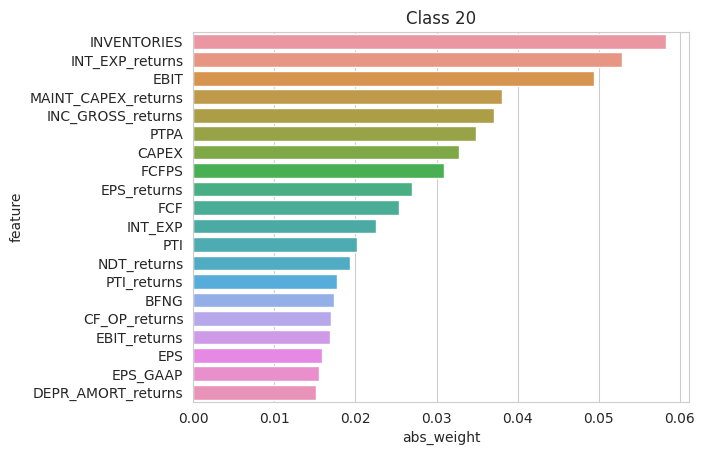

In [43]:
plot_importance(best_xg_clf,x_train.columns, 20)

In [44]:
rf = RandomForestClassifier(random_state=SEED)
result_dict = evaluate_model(rf, x_train_lr, y_train_lr, x_test_lr, y_test_lr)
results_by_model = results_by_model.append(result_dict, ignore_index=True)

roc_auc_score for model RandomForestClassifier = 0.869


In [45]:
results_by_model.sort_values(by='roc_auc_score', ascending=False)

,roc_auc_score,classifier
2,0.896481,XGBClassifier
3,0.891637,XGBClassifier
4,0.884498,XGBClassifier
5,0.868562,RandomForestClassifier
0,0.645334,LogisticRegression
1,0.544365,LogisticRegression


The XGBoost classifier had the best roc auc scores

## Pickled model

In [48]:
xg_clf.fit(x_data_lr, y_data_lr)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [50]:
pickle.dump(xg_clf, open('model.pkl', 'wb'))

Features used:
*  indices: 'id', 'fiscal_year_end_year'
*  features: 'ASSETS', 'BFNG', 'BPS', 'CAPEX', 'CFPS', 'CF_FIN', 'CF_INV', 'CF_OP',
       'CURRENT_ASSETS', 'CURRENT_LIABILITIES', 'DEPR_AMORT', 'EBIT', 'EBITDA',
       'EBITDA_ADJ', 'EBITDA_REP', 'EPS', 'EPS_GAAP', 'EPS_NONGAAP', 'FCF',
       'FCFPS', 'GW_TOT', 'G_A_EXP', 'INC_GROSS', 'INT_EXP', 'INVENTORIES',
       'MAINT_CAPEX', 'NDT', 'NET', 'NETBG', 'PTI', 'PTIAG', 'PTPA', 'SALES',
       'SGA', 'SH_EQUITY', 'TAX_EXPENSE', 'TOTAL_DEBT', 'ASSETS_returns',
       'BFNG_returns', 'BPS_returns', 'CAPEX_returns', 'CF_FIN_returns',
       'CF_INV_returns', 'CF_OP_returns', 'CURRENT_ASSETS_returns',
       'CURRENT_LIABILITIES_returns', 'DEPR_AMORT_returns', 'EBIT_returns',
       'EBITDA_returns', 'EBITDA_ADJ_returns', 'EPS_GAAP_returns',
       'EPS_NONGAAP_returns', 'FCF_returns', 'GW_TOT_returns',
       'G_A_EXP_returns', 'INC_GROSS_returns', 'INT_EXP_returns',
       'MAINT_CAPEX_returns', 'NDT_returns', 'NET_returns', 'NETBG_returns',
       'PTI_returns', 'PTIAG_returns', 'PTPA_returns', 'SGA_returns',
       'SH_EQUITY_returns', 'TAX_EXPENSE_returns', 'TOTAL_DEBT_returns',
       'CFPS_returns', 'EPS_returns', 'SALES_returns', 'debt_factor',
       'profitability', 'financial_health_score'



